In [1]:
from IPython.display import display, HTML, Image

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import copy
import random

from sklearn.base import BaseEstimator, ClassifierMixin, clone
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

from sklearn.metrics import make_scorer
from sklearn import metrics

# to avoid future warnings for sklearn
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Read the CSV file
dataset = pd.read_csv('yeast.csv')
print("Dataset.shape: " + str(dataset.shape))

# split the features-X and class labels-y
X = dataset.iloc[:, :-14]
y = dataset.iloc[:, -14:]

print("X.shape: " + str(X.shape))
display(X.head())
print("y.shape: " + str(y.shape))
display(y.head())
print("Descriptive stats:")
X.describe()

Dataset.shape: (2417, 117)
X.shape: (2417, 103)


,Att1,Att2,Att3,Att4,Att5,Att6,Att7,Att8,Att9,Att10,...,Att94,Att95,Att96,Att97,Att98,Att99,Att100,Att101,Att102,Att103
0,0.004168,-0.170975,-0.156748,-0.142151,0.058781,0.026851,0.197719,0.041850,0.066938,-0.056617,...,0.006166,-0.012976,-0.014259,-0.015024,-0.010747,0.000411,-0.032056,-0.018312,0.030126,0.124722
1,-0.103956,0.011879,-0.098986,-0.054501,-0.007970,0.049113,-0.030580,-0.077933,-0.080529,-0.016267,...,0.007680,0.027719,-0.085811,0.111123,0.050541,0.027565,-0.063569,-0.041471,-0.079758,0.017161
2,0.509949,0.401709,0.293799,0.087714,0.011686,-0.006411,-0.006255,0.013646,-0.040666,-0.024447,...,0.096277,-0.044932,-0.089470,-0.009162,-0.012010,0.308378,-0.028053,0.026710,-0.066565,-0.122352
3,0.119092,0.004412,-0.002262,0.072254,0.044512,-0.051467,0.074686,-0.007670,0.079438,0.062184,...,-0.083809,0.200354,-0.075716,0.196605,0.152758,-0.028484,-0.074207,-0.089227,-0.049913,-0.043893
4,0.042037,0.007054,-0.069483,0.081015,-0.048207,0.089446,-0.004947,0.064456,-0.133387,0.068878,...,-0.060467,0.044351,-0.057209,0.028047,0.029661,-0.050026,0.023248,-0.061539,-0.035160,0.067834


y.shape: (2417, 14)


,Class1,Class2,Class3,Class4,Class5,Class6,Class7,Class8,Class9,Class10,Class11,Class12,Class13,Class14
0,0,0,0,0,0,0,1,1,0,0,0,1,1,0
1,0,0,1,1,0,0,0,0,0,0,0,0,0,0
2,0,1,1,0,0,0,0,0,0,0,0,1,1,0
3,0,0,1,1,0,0,0,0,0,0,0,0,0,0
4,0,0,1,1,1,1,0,0,0,0,0,0,0,0


Descriptive stats:


,Att1,Att2,Att3,Att4,Att5,Att6,Att7,Att8,Att9,Att10,...,Att94,Att95,Att96,Att97,Att98,Att99,Att100,Att101,Att102,Att103
count,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,...,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000
mean,0.001173,-0.000436,-0.000257,0.000265,0.001228,0.000475,0.001107,0.000420,0.001076,-0.000009,...,-0.000773,0.000464,-0.000515,0.000667,0.000324,-0.001483,-0.001047,-0.001539,0.000284,0.007605
std,0.097411,0.097885,0.097746,0.096969,0.096909,0.097306,0.097170,0.096803,0.096326,0.096805,...,0.093316,0.096684,0.096209,0.096635,0.096280,0.094369,0.096900,0.094211,0.093154,0.099368
min,-0.371146,-0.472632,-0.339195,-0.467945,-0.367044,-0.509447,-0.319928,-0.594498,-0.369712,-0.767128,...,-0.455191,-0.283594,-0.279408,-0.226420,-0.225374,-0.501572,-0.236589,-0.267052,-0.194079,-0.237752
25%,-0.053655,-0.058734,-0.057526,-0.057149,-0.058461,-0.060212,-0.058445,-0.062849,-0.063472,-0.065010,...,-0.054133,-0.056415,-0.056414,-0.059382,-0.058025,-0.053591,-0.063318,-0.059542,-0.054078,-0.077191
50%,0.003649,-0.003513,0.002892,-0.000153,0.005565,0.000321,0.006179,0.001436,0.003515,0.002432,...,-0.012893,-0.023595,-0.024313,-0.023059,-0.021942,-0.018216,-0.033623,-0.023519,-0.012007,0.022126
75%,0.057299,0.048047,0.061007,0.054522,0.066286,0.059908,0.068892,0.061418,0.064958,0.063096,...,0.027977,0.034937,0.036057,0.041430,0.035730,0.019583,0.038901,0.025408,0.028087,0.103185
max,0.520272,0.614114,0.353241,0.568960,0.307649,0.336971,0.351401,0.454591,0.419852,0.420876,...,0.609175,0.542867,0.547134,0.385928,0.540493,0.569250,0.509963,0.587358,0.700340,0.163431


In [3]:
# Normalise the data
X = (X-X.min())/(X.max()-X.min())

# split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, train_size=0.7)

print("X_train.shape: " + str(X_train.shape))
print("X_test.shape: " + str(X_test.shape))
print("y_train.shape: " + str(y_train.shape))
print("y_test.shape: " + str(y_test.shape))

X_train.shape: (1691, 103)
X_test.shape: (726, 103)
y_train.shape: (1691, 14)
y_test.shape: (726, 14)


In [4]:
X_train_array=X_train.values
y_train_array=y_train.values
X_test_array=X_test.values
y_test_array=y_test.values

## ML-kNN Classifier

In [5]:
from abc import ABCMeta, abstractmethod
from sklearn.base import BaseEstimator
from sklearn import neighbors

class NeighborsBase(BaseEstimator, metaclass=ABCMeta):
    """Base class for nearest neighbors estimators."""

    @abstractmethod
    def __init__(self, n_neighbors=None,
                 algorithm='auto', leaf_size=30, metric='minkowski',
                 p=2, metric_params=None, n_jobs=None):
        
        self.n_neighbors = n_neighbors
        self.algorithm = algorithm
        self.leaf_size = leaf_size
        self.metric = metric
        self.metric_params = metric_params
        self.p = p
        self.n_jobs = n_jobs
        self._check_algorithm_metric()

    def _check_algorithm_metric(self):
        if self.algorithm not in ['auto', 'brute',
                                  'kd_tree', 'ball_tree']:
            raise ValueError("unrecognized algorithm: '%s'" % self.algorithm)

        if self.algorithm == 'auto':
            if (callable(self.metric) or
                  self.metric in neighbors.VALID_METRICS['ball_tree']):
                alg_check = 'ball_tree'
            else:
                alg_check = 'brute'
        else:
            alg_check = self.algorithm

        if callable(self.metric):
            if self.algorithm == 'kd_tree':
                # callable metric is only valid for brute force and ball_tree
                raise ValueError(
                    "kd_tree does not support callable metric '%s'"
                    "Function call overhead will result"
                    "in very poor performance."
                    % self.metric)
        elif self.metric not in neighbors.VALID_METRICS[alg_check]:
            raise ValueError("Metric '%s' not valid. Use "
                             "sorted(sklearn.neighbors.VALID_METRICS['%s']) "
                             "to get valid options. "
                             "Metric can also be a callable function."
                             % (self.metric, alg_check))

        if self.metric_params is not None and 'p' in self.metric_params:
            if self.p is not None:
                warnings.warn("Parameter p is found in metric_params. "
                              "The corresponding parameter from __init__ "
                              "is ignored.", SyntaxWarning, stacklevel=3)
            effective_p = self.metric_params['p']
        else:
            effective_p = self.p

        if self.metric in ['wminkowski', 'minkowski'] and effective_p < 1:
            raise ValueError("p must be greater than one for minkowski metric")

In [6]:
import sys
sys.path.append("..")

import numpy as np

from sklearn.base import ClassifierMixin
from sklearn.neighbors import NearestNeighbors

class MLkNN(ClassifierMixin, NeighborsBase):
    def __init__(self, n_neighbors=5, s = 1, metric = 'minkowski', p=2,
                 algorithm='auto', leaf_size=30, metric_params=None,n_jobs = None):
        
        
        super().__init__(
            n_neighbors=n_neighbors,
            algorithm=algorithm,
            leaf_size=leaf_size, metric=metric, p=p,
            metric_params=metric_params,
            n_jobs=n_jobs)
        
        self._k = n_neighbors
        self.s = s
        self.nn_obj = self.__set_nn_obj()
        self.prior = None
        self.posterior = None
        
    def __set_params(self, X, y):
        n_labels = y.shape[1]
        self.__dict__.update({'n_labels': n_labels})
        self.__fit_nn_obj(X)
    
    def __set_nn_obj(self):
        if self.metric is not None:
            return NearestNeighbors(n_neighbors = self._k + 1, metric = self.metric,
                algorithm = self.algorithm, leaf_size = self.leaf_size, p = self.p,
                metric_params = self.metric_params, n_jobs = self.n_jobs)
        else:
            raise Exception("Metric cannot be none")
        
    def __fit_nn_obj(self, X):
        _ = self.nn_obj.fit(X)
    
    def __get_nn_matrix(self, X, train=False):
        if train:
            return self.nn_obj.kneighbors(X, n_neighbors=self._k+1, return_distance=False)[:,1:]
        else:
            return self.nn_obj.kneighbors(X, n_neighbors=self._k, return_distance=False)
    
#     def __get_membership_counting_vectors(nn_mat):
#         C_x = np.empty(self.y_train.shape)
#         for i, row in enumerate(nn_mat):
#             C_x[i] = self.y_train[row[1:]].sum(axis=0)
#         return C_x
    
    def __set_prior(self, y_train):
        prior = np.zeros((self.n_labels, 2))
        prior[:,1] = (self.s + y_train.sum(axis=0)) / (self.s * 2 + y_train.shape[0])
        prior[:,0] = 1 - prior[:,1]
        setattr(self, 'prior', prior)
    
    def __set_posterior(self, C_x, y):
        posterior = np.zeros((self.n_labels, self._k+1, 2))
        for label in range(self.n_labels):
            c = np.zeros(self._k + 1)
            c_p = np.zeros(self._k + 1)
            for row in range(C_x.shape[0]):
                d = C_x[row,label]
                if y[row,label] == 1:
                    c[d] += 1
                else:
                    c_p[d] += 1
            for neighbor in range(self._k+1):
                posterior[label,neighbor,1]=(self.s+c[neighbor])/(self.s*(self._k+1)+c.sum())
                posterior[label,neighbor,0]=(self.s+c_p[neighbor])/(self.s*(self._k+1)+c_p.sum())

        setattr(self, 'posterior', posterior)
    
    def __get_membership_counting_vectors(self, nn_mat, y_train):
        return np.array([y_train[row].sum(axis=0) for row in nn_mat], dtype=int)
    
    def fit(self, X, y):
        if y.shape[1] < 2:
            raise ValueError("Target must be one-hot encoded label vectors")
        
        self.__dict__.update({'__x_train': X, '__y_train': y})
        
        self.__set_params(X, y)
        self.__set_prior(y)
        nn_mat = self.__get_nn_matrix(X)#, train=True)
        
        C_x = self.__get_membership_counting_vectors(nn_mat, y)
        self.__set_posterior(C_x, y)
    
    def predict(self, X):
        y_pred = np.zeros((X.shape[0], self.n_labels))
        nn_mat = self.__get_nn_matrix(X)
        C_x = self.__get_membership_counting_vectors(nn_mat, getattr(self, '__y_train'))
        for label in range(self.n_labels):
            for row in range(C_x.shape[0]):
                y_t_1 = self.prior[label, 1] * self.posterior[label, C_x[row, label], 1]
                y_t_0 = self.prior[label, 0] * self.posterior[label, C_x[row, label], 0]
                y_pred[row, label] = int(y_t_0 <= y_t_1)
        
        return y_pred.astype(int)
    
    def predict_proba(self, X):
        r_pred = np.zeros((X.shape[0], self.n_labels))
        nn_mat = self.__get_nn_matrix(X)
        C_x = self.__get_membership_counting_vectors(nn_mat, getattr(self, '__y_train'))
        for label in range(self.n_labels):
            for row in range(C_x.shape[0]):
                y_t_1 = self.prior[label, 1] * self.posterior[label, C_x[row, label], 1]
                y_t_0 = self.prior[label, 0] * self.posterior[label, C_x[row, label], 0]
                r_pred[row, label] = y_t_1 / (y_t_0 + y_t_1)
        
        return r_pred
    
    def __get_valid_metric(self, show_all=False):
        if show_all:
            return neighbors.VALID_METRICS
        
        if self.algorithm == 'auto':
            if (callable(self.metric) or
                  self.metric in neighbors.VALID_METRICS['ball_tree']):
                alg_check = 'ball_tree'
            else:
                alg_check = 'brute'
        else:
            alg_check = self.algorithm
        return neighbors.VALID_METRICS[alg_check]
    
    def VALID_METRIC(self, show_all=False):
        return self.__get_valid_metric(show_all)

In [7]:
# instantiate the classifier
mlknn_clf = MLkNN()
# fit
mlknn_clf.fit(X_train_array, y_train_array)
# predict
y_pred = mlknn_clf.predict(X_test_array)
print("y_pred.shape: " + str(y_pred.shape))

y_pred.shape: (726, 14)


## Permutation Feature Importance

In [12]:
import eli5
from eli5.sklearn import PermutationImportance

In [13]:
perms_mlknn = PermutationImportance(mlknn_clf).fit(X_test_array, y_test_array)
eli5.show_weights(perms_mlknn,top=20,feature_names = X.columns.tolist())

Weight,Feature
0.0052 ± 0.0053,Att49
0.0052 ± 0.0073,Att64
0.0052 ± 0.0061,Att60
0.0047 ± 0.0045,Att79
0.0047 ± 0.0064,Att93
0.0044 ± 0.0068,Att92
0.0044 ± 0.0040,Att100
0.0041 ± 0.0039,Att84
0.0039 ± 0.0059,Att86
0.0036 ± 0.0075,Att72


In [17]:
eli5.show_weights(perms_mlknn,top=25,feature_names = X.columns.tolist())

Weight,Feature
0.0052 ± 0.0053,Att49
0.0052 ± 0.0073,Att64
0.0052 ± 0.0061,Att60
0.0047 ± 0.0045,Att79
0.0047 ± 0.0064,Att93
0.0044 ± 0.0040,Att100
0.0044 ± 0.0068,Att92
0.0041 ± 0.0039,Att84
0.0039 ± 0.0059,Att86
0.0036 ± 0.0075,Att72


In [18]:
eli5.show_weights(perms_mlknn,top=103,feature_names = X.columns.tolist())

Weight,Feature
0.0052 ± 0.0073,Att64
0.0052 ± 0.0053,Att49
0.0052 ± 0.0061,Att60
0.0047 ± 0.0045,Att79
0.0047 ± 0.0064,Att93
0.0044 ± 0.0040,Att100
0.0044 ± 0.0068,Att92
0.0041 ± 0.0039,Att84
0.0039 ± 0.0059,Att86
0.0036 ± 0.0075,Att72


## LIME

In [19]:
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)


In [25]:
# Creating the Lime Explainer
# Be very careful in setting the order of the class names
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="lasso_path",
    class_names=["Class1","Class2","Class3","Class4","Class5","Class6","Class7","Class8","Class9","Class10","Class11","Class12","Class13","Class14"],
    discretize_continuous=True,
    discretizer="entropy",
)

In [26]:
#Now let's pick a sample case from our test set.
row = 550
exp = lime_explainer.explain_instance(X_test.iloc[row], mlknn_clf.predict_proba, num_features=20)
exp.show_in_notebook(show_table=True)

In [27]:
#Now let's pick a sample case from our test set.
row = 700
exp = lime_explainer.explain_instance(X_test.iloc[row], mlknn_clf.predict_proba, num_features=20)
exp.show_in_notebook(show_table=True)

## SHAP

In [8]:
import shap
import time
shap.initjs()

In [9]:
#First, build the explainer.
explainer_mlknn = shap.KernelExplainer(mlknn_clf.predict_proba,X_train)

Using 1691 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


### SHAP values of X_test.iloc[550,:]

In [30]:
shap_values = explainer_mlknn.shap_values(X_test.iloc[550,:])

#### X_test.iloc[550,:] label: 2,13,12,1

In [31]:
shap.force_plot(explainer_mlknn.expected_value[1], shap_values[1], X_test.iloc[550,:])

In [32]:
shap.force_plot(explainer_mlknn.expected_value[12], shap_values[12], X_test.iloc[550,:])

In [33]:
shap.force_plot(explainer_mlknn.expected_value[11], shap_values[11], X_test.iloc[550,:])

In [34]:
shap.force_plot(explainer_mlknn.expected_value[0], shap_values[0], X_test.iloc[550,:])

#### X_test.iloc[550,:] label: all the other labels

In [35]:
shap.force_plot(explainer_mlknn.expected_value[2], shap_values[2], X_test.iloc[550,:])

In [36]:
shap.force_plot(explainer_mlknn.expected_value[3], shap_values[3], X_test.iloc[550,:])

In [37]:
shap.force_plot(explainer_mlknn.expected_value[4], shap_values[4], X_test.iloc[550,:])

In [38]:
shap.force_plot(explainer_mlknn.expected_value[5], shap_values[5], X_test.iloc[550,:])

In [39]:
shap.force_plot(explainer_mlknn.expected_value[6], shap_values[6], X_test.iloc[550,:])

In [40]:
shap.force_plot(explainer_mlknn.expected_value[7], shap_values[7], X_test.iloc[550,:])

In [41]:
shap.force_plot(explainer_mlknn.expected_value[8], shap_values[8], X_test.iloc[550,:])

In [42]:
shap.force_plot(explainer_mlknn.expected_value[9], shap_values[9], X_test.iloc[550,:])

In [43]:
shap.force_plot(explainer_mlknn.expected_value[10], shap_values[10], X_test.iloc[550,:])

In [44]:
shap.force_plot(explainer_mlknn.expected_value[13], shap_values[13], X_test.iloc[550,:])

### SHAP values of X_test.iloc[700,:]

In [45]:
shap_values = explainer_mlknn.shap_values(X_test.iloc[700,:])

#### X_test.iloc[700,:] label: 3,4,2,12

In [46]:
shap.force_plot(explainer_mlknn.expected_value[2], shap_values[2], X_test.iloc[700,:])

In [47]:
shap.force_plot(explainer_mlknn.expected_value[3], shap_values[3], X_test.iloc[700,:])

In [48]:
shap.force_plot(explainer_mlknn.expected_value[11], shap_values[11], X_test.iloc[700,:])

In [49]:
shap.force_plot(explainer_mlknn.expected_value[1], shap_values[1], X_test.iloc[700,:])

#### X_test.iloc[700,:] label: all the other labels

In [50]:
shap.force_plot(explainer_mlknn.expected_value[0], shap_values[0], X_test.iloc[700,:])

In [51]:
shap.force_plot(explainer_mlknn.expected_value[4], shap_values[4], X_test.iloc[700,:])

In [52]:
shap.force_plot(explainer_mlknn.expected_value[5], shap_values[5], X_test.iloc[700,:])

In [53]:
shap.force_plot(explainer_mlknn.expected_value[6], shap_values[6], X_test.iloc[700,:])

In [54]:
shap.force_plot(explainer_mlknn.expected_value[7], shap_values[7], X_test.iloc[700,:])

In [55]:
shap.force_plot(explainer_mlknn.expected_value[8], shap_values[8], X_test.iloc[700,:])

In [56]:
shap.force_plot(explainer_mlknn.expected_value[9], shap_values[9], X_test.iloc[700,:])

In [57]:
shap.force_plot(explainer_mlknn.expected_value[10], shap_values[10], X_test.iloc[700,:])

In [58]:
shap.force_plot(explainer_mlknn.expected_value[12], shap_values[12], X_test.iloc[700,:])

In [59]:
shap.force_plot(explainer_mlknn.expected_value[13], shap_values[13], X_test.iloc[700,:])

In [1]:
# using kmeans
#X_train_summary = shap.kmeans(X_train, 10)
#explainer_mlknn = shap.KernelExplainer(mlknn_clf.predict_proba, X_train_summary)
#shap_values_KNN_test = explainer_mlknn.shap_values(X_test)

### Summerize the explanations of predictions about Class1

In [12]:
shap.force_plot(explainer_mlknn.expected_value[0], shap_values_KNN_test[0], X_test)

### Summerize the explanations of predictions about Class2

In [13]:
shap.force_plot(explainer_mlknn.expected_value[1], shap_values_KNN_test[1], X_test)

### Summerize the explanations of predictions about Class3

In [14]:
shap.force_plot(explainer_mlknn.expected_value[2], shap_values_KNN_test[2], X_test)

### Feature Importance

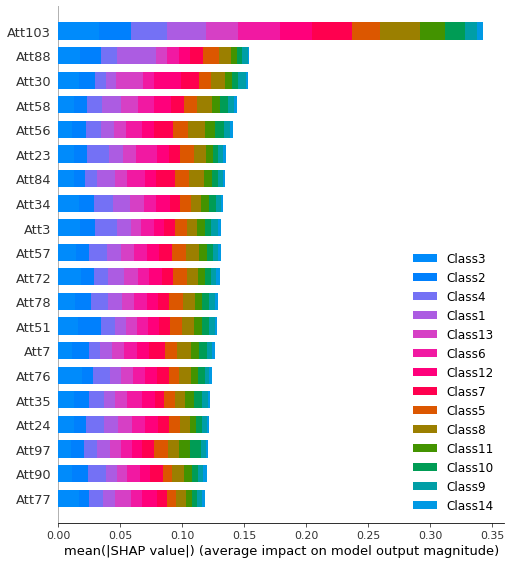

In [15]:
shap.summary_plot(shap_values_KNN_test, X, plot_type="bar",class_names = y.columns.tolist())

## Summary plot

### How each feature impacts Class3

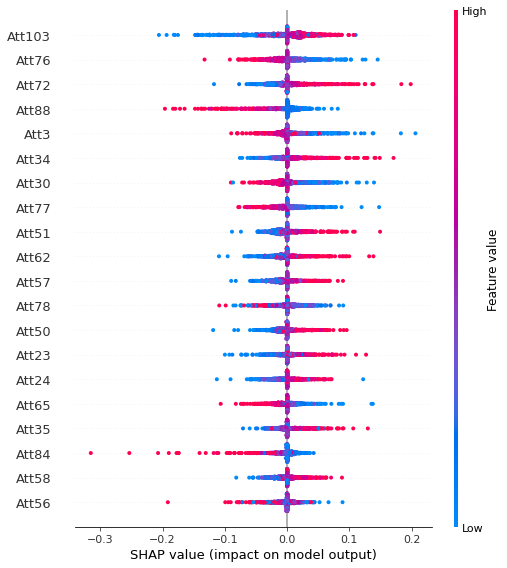

In [16]:
shap.summary_plot(shap_values_KNN_test[2], X_test)

### How each feature impacts Class2

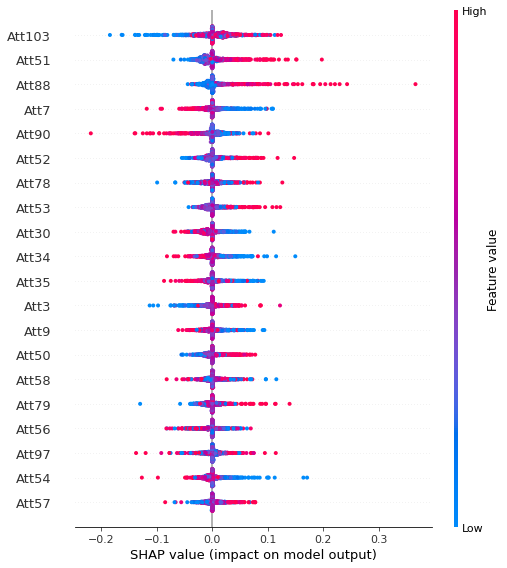

In [17]:
shap.summary_plot(shap_values_KNN_test[1], X_test)

### How each feature impacts Class4

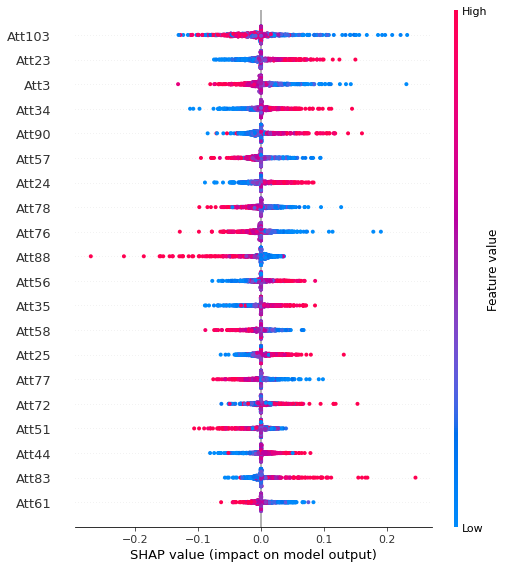

In [18]:
shap.summary_plot(shap_values_KNN_test[3], X_test)

### How each feature impacts Class1

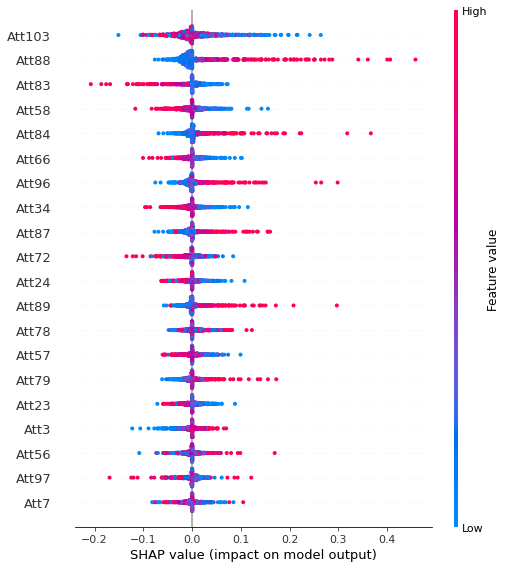

In [19]:
shap.summary_plot(shap_values_KNN_test[0], X_test)

## Depandence plot

### Feature "Att76" on Label Class3

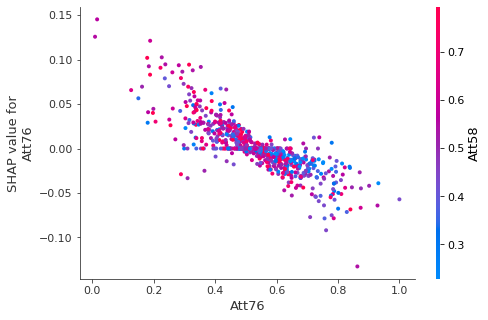

In [21]:
shap.dependence_plot("Att76", shap_values_KNN_test[2], X_test)

### Feature "Att51" on Label Class2

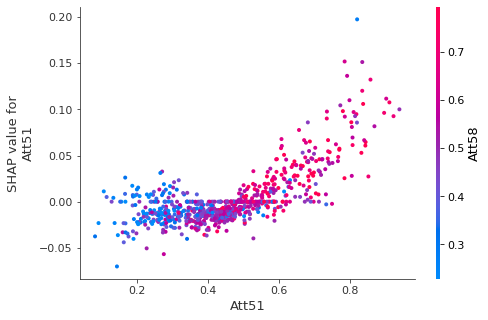

In [23]:
shap.dependence_plot("Att51", shap_values_KNN_test[1], X_test)

### Feature "Att34" on Label Class4

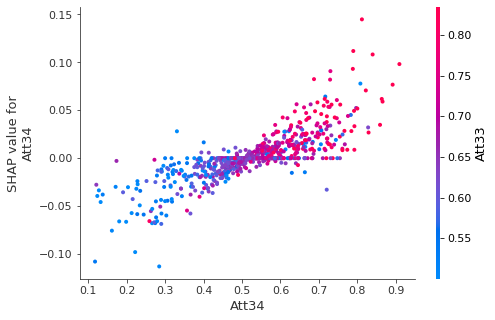

In [25]:
shap.dependence_plot("Att34", shap_values_KNN_test[3], X_test)

### Feature "Att88" on Label Class1

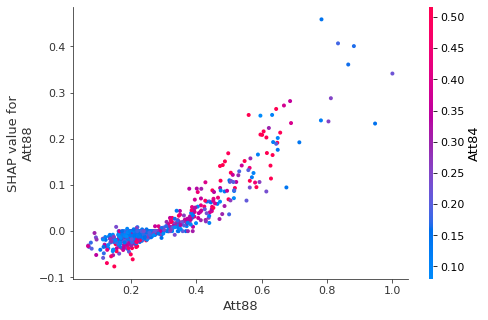

In [26]:
shap.dependence_plot("Att88", shap_values_KNN_test[0], X_test)

In [27]:
from sklearn.inspection import permutation_importance

In [33]:
plt.rcParams['figure.figsize'] = (15.0, 12.0)   # unit: inches

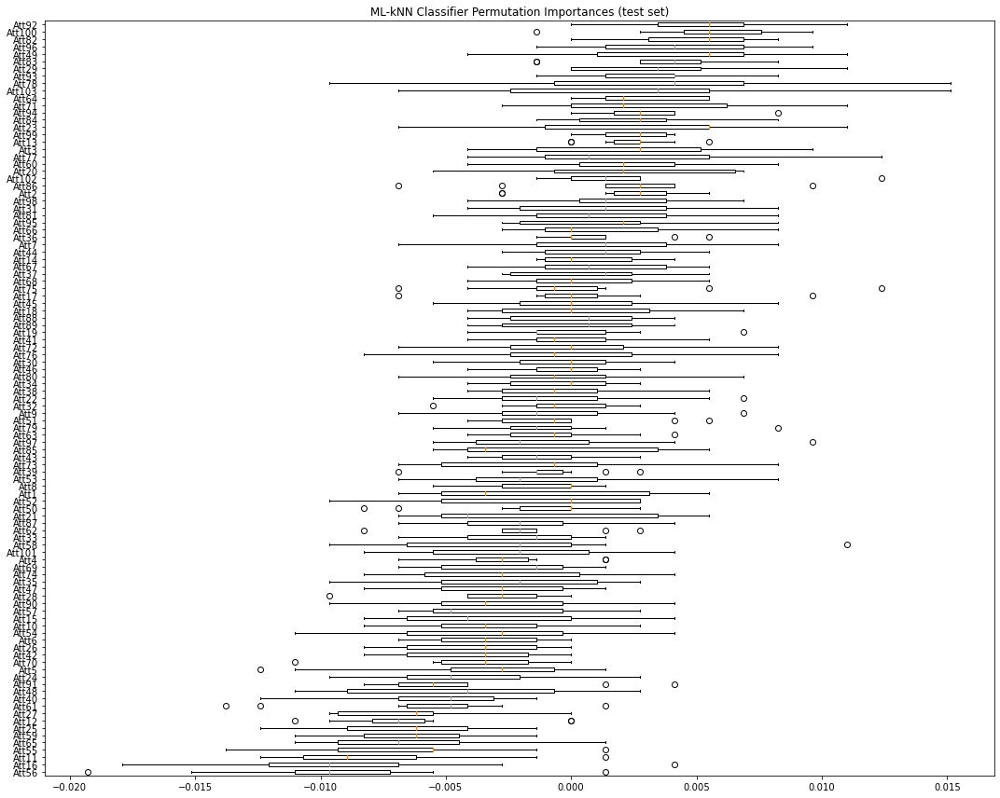

In [34]:
result_MLkNN_clf = permutation_importance(mlknn_clf, X_test, y_test, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx = result_MLkNN_clf.importances_mean.argsort()

fig, ax = plt.subplots()
ax.boxplot(result_MLkNN_clf.importances[sorted_idx].T,
           vert=False, labels=X_test.columns[sorted_idx])
ax.set_title("ML-kNN Classifier Permutation Importances (test set)")
fig.tight_layout()
plt.show()

In [31]:
plt.show()

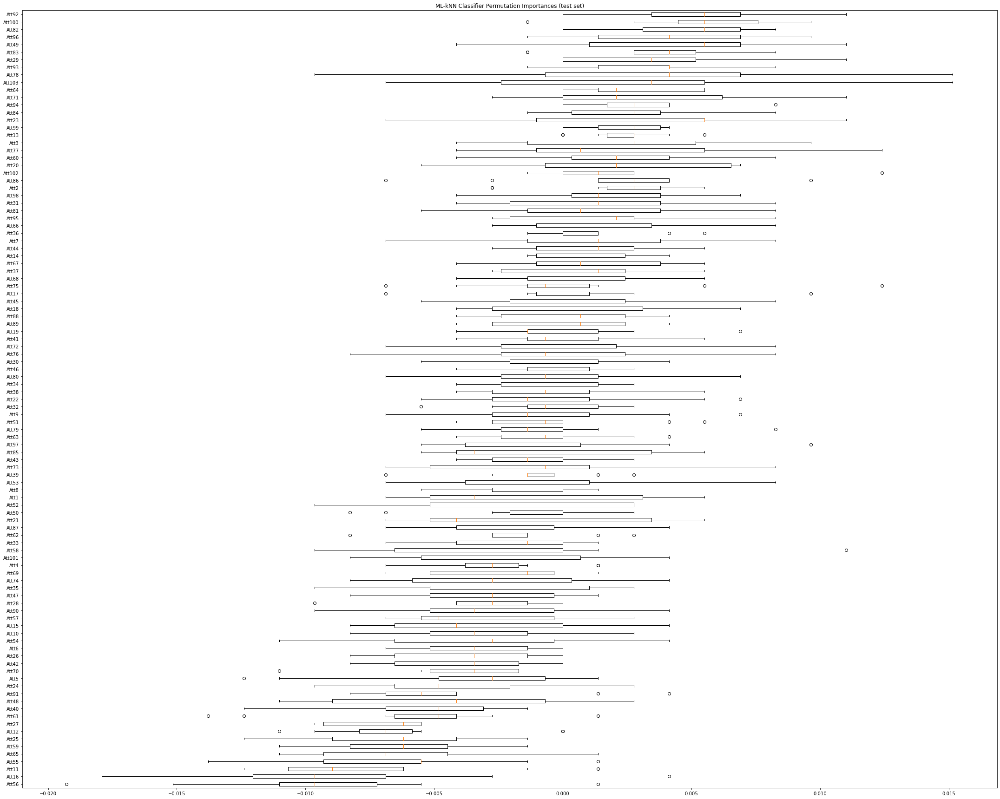

In [32]:
fig, ax = plt.subplots()
ax.boxplot(result_MLkNN_clf.importances[sorted_idx].T,
           vert=False, labels=X_test.columns[sorted_idx])
ax.set_title("ML-kNN Classifier Permutation Importances (test set)")
fig.tight_layout()
plt.show()